<a href="https://colab.research.google.com/github/dsuwala/small_projects/blob/main/genetic_algorithm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import itertools

In [2]:
#step to have animations working within colab
from matplotlib import rc
rc('animation', html='jshtml', embed_limit='4096')

# README
The project is about training cellular automaton which will evolve random cellular automaton to a checkerboard.

# Step 1: Cellular automaton with specified ruleset

In this step there is encoded cellular automaton which accepts specified ruleset as numpy array of zeros and one. Encoding of state of a cell is done as in the figure below:

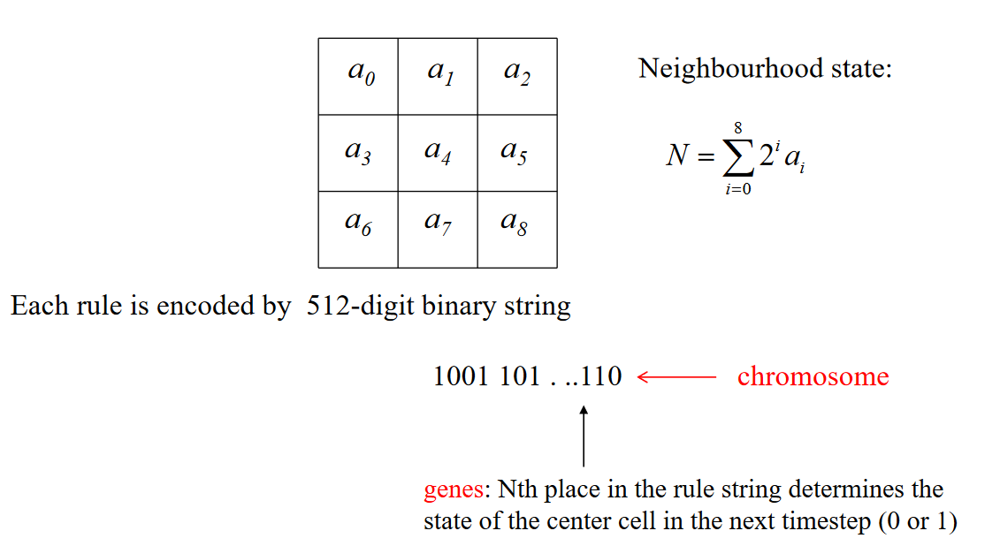

In [ ]:
def neigborhood_state(state : np.ndarray) -> np.ndarray:

    N = np.zeros(shape=state.shape)

    # 0 1 2
    # 3 4 5
    # 6 7 8
    # upper row
    N += 2**0 * np.roll(np.roll(state, 1, axis=0), -1, axis=1)
    N += 2**1 * np.roll(state, 1, axis=0)
    N += 2**2 * np.roll(np.roll(state, 1, axis=0), 1, axis=1)

    # same row
    N += 2**3 * np.roll(state, -1, axis=0)
    N += 2**4 * state
    N += 2**5 * np.roll(state, 1, axis=0)

    # bottom row
    N += 2**6 * np.roll(np.roll(state, -1, axis=0), -1, axis=1)
    N += 2**7 * np.roll(state, -1, axis=0)
    N += 2**8 * np.roll(np.roll(state, 1, axis=0), -1, axis=1)

    return N.astype(int)

In [ ]:
N = 50
init_state = np.random.randint(2, size=(N, N))
ruleset = np.random.randint(2, size=512)
# ruleset = np.array([i for i in np.random.randint(2, size=512)])
states = [init_state]

In [ ]:
old_state = init_state

for step in range(100):

    new_state = ruleset[neigborhood_state(old_state)]
    states.append(new_state.copy())
    old_state = new_state

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10,8))
fig.set_tight_layout(True)

def animate(i):
    ax.clear()

    ax.imshow(states[i])

anim = FuncAnimation(fig, func=animate, interval=100, frames=100)
plt.close()
anim

---
# Main
Cellular Automaton class and training by genetic algorithm

In [3]:
class CellularAutomaton:
    # class of one cellular automaton which knowns its state


    def __init__(self, id: int, genome: np.ndarray, init_state: np.ndarray) -> None:
        # genome = ruleset encoded as sequence of zero and one
        # state = current state of the board
        # nbh_state = neighbors state encoded as in step 1 paragraph
        # score = scorre after fitting evaluation

        self.id = id
        self.genome = genome
        self.state = init_state
        self.history: list = []
        self.nbh_state: np.ndarray = np.zeros(shape=self.state.shape)
        self.score: float = 0

    # evolve board one step
    def evolve(self) -> None:
        # evolve one step

        self.calculate_nbh_state()
        self.history.append(self.state.copy())
        self.state = self.genome[self.nbh_state.astype(int)]

    # calculate current state
    def calculate_nbh_state(self) -> None:

        self.nbh_state = np.zeros(shape=self.state.shape)

        # 0 1 2
        # 3 4 5
        # 6 7 8
        # upper row
        self.nbh_state += 2**0 * np.roll(np.roll(self.state, 1, axis=0), 1, axis=1)
        self.nbh_state += 2**1 * np.roll(self.state, 1, axis=0)
        self.nbh_state += 2**2 * np.roll(np.roll(self.state, 1, axis=0), -1, axis=1)

        # same row
        self.nbh_state += 2**3 * np.roll(self.state, 1, axis=1)
        self.nbh_state += 2**4 * self.state
        self.nbh_state += 2**5 * np.roll(self.state, -1, axis=1)

        # bottom row
        self.nbh_state += 2**6 * np.roll(np.roll(self.state, -1, axis=0), 1, axis=1)
        self.nbh_state += 2**7 * np.roll(self.state, -1, axis=0)
        self.nbh_state += 2**8 * np.roll(np.roll(self.state, -1, axis=0), -1, axis=1)

    # inject mutation to genome
    def mutate(self, n):
        #mutate n genes randomy switching parts of genome

        mutations_indices = np.random.randint(len(self.genome), size=n)

        self.genome[mutations_indices] = np.logical_not(self.genome[mutations_indices])


In [4]:
def calculate_score(automaton: CellularAutomaton):
    # fitting function which grants points for diagonal cells with the same state
    # and penalty for off diagonal

    score = 0.

    # (x + 1, y + 1) and (x + 1, y - 1) cells
    xp1_yp1 = np.roll(np.roll(automaton.state, 1, axis=0), -1, axis=1)

    xp1_ym1 = np.roll(np.roll(automaton.state, -1, axis=0), -1, axis=1)

    # (x, y + 1) and (x + 1, y) cells
    xp1_y = np.roll(automaton.state, -1, axis=1)
    x_ym1 = np.roll(automaton.state, 1, axis=0)

    # add/remove points
    for i in range(automaton.state.shape[0]):
        for j in range(automaton.state.shape[0]):

            if automaton.state[i, j] == x_ym1[i,j] or automaton.state[i, j] == xp1_y[i, j]:
                score -= 3.
            else:

                if automaton.state[i, j] == xp1_yp1[i, j]:
                    score += 8.
                else:
                    score -= 5.

                if automaton.state[i, j] == xp1_ym1[i, j]:
                    score += 8.
                else:
                    score -= 5.

    return score


# create new automatons with genome constructed at random from
# genomes of parents such that child genome contains 50% each parent genome
def breed(child_id: int, parents: tuple) -> None:

    parents_genome = (parents[0].genome, parents[1].genome)


    child_genome = np.array([ parents_genome[np.random.randint(2)][i] for i in range(len(parents[0].genome)) ])

    return CellularAutomaton(child_id,
                             child_genome,
                             np.random.randint(2, size=parents[0].state.shape))


# get breeding pairs from the population of automatons
def get_parent_pairs(population: np.ndarray, parents_number) -> list:

    breeding_weights = np.array([ca.score if ca.score >=0 else 0.01 for ca in population], dtype=float)
    breeding_weights/=breeding_weights.sum()

    pairs = [tuple(np.random.choice(population, size=2, p=breeding_weights, replace=False)) for i in range(parents_number) ]

    return pairs

In [5]:
# driver evolution code

# parameters
N = 50 #grid size
generations = 250
pop_size = 20 #number of automatons
population = [CellularAutomaton(n,
                                np.random.randint(2, size=512),
                                np.random.randint(2, size=(N, N))) for n in range(pop_size)]
max_score = np.empty(shape=0, dtype=float)
max_score = np.append(max_score, 0)

# evolution
for generation in range(generations):

    print(f"generation: {generation}, population size: {len(population)}")
    print(f"current_max_score: {max_score[-1]}")


    # grow up population and score them
    for ca in population:

        temp_score = np.empty(shape=3, dtype=float)
        for training in range(3):
            for step in range(100):
                ca.evolve()

            temp_score[training] = calculate_score(ca)
            ca.state = np.random.randint(2, size=(N, N))

        ca.score = np.mean(temp_score)

    # score performance and remove worst performers
    population.sort(key= lambda a : a.score)
    population = population[len(population)//2:]
    # max_score.append(population[-1].score)
    max_score = np.append(max_score, population[-1].score)

    # breeed new generation from best performers
    pairs = get_parent_pairs(population, pop_size - len(population))
    new_generation = np.array([breed(idx, pairs[a]) for idx, a in enumerate(np.random.randint( len(pairs), size= pop_size - len(population)) )])

    # introduce mutations
    for ca_id in np.random.randint(len(new_generation), size=4):
        population[ca_id].mutate(2)
    # new_generation[np.random.randint(len(new_generation))].mutate(2)

    population = np.concatenate((population, new_generation.copy())).tolist()

print([ca.score for ca in population])

generation: 0, population size: 20
current_max_score: 0.0
generation: 1, population size: 20
current_max_score: -3072.0
generation: 2, population size: 20
current_max_score: -2647.6666666666665
generation: 3, population size: 20
current_max_score: -2681.0
generation: 4, population size: 20
current_max_score: -2481.0
generation: 5, population size: 20
current_max_score: -2855.3333333333335
generation: 6, population size: 20
current_max_score: -2675.0
generation: 7, population size: 20
current_max_score: -2172.3333333333335
generation: 8, population size: 20
current_max_score: -2373.0
generation: 9, population size: 20
current_max_score: -2584.6666666666665
generation: 10, population size: 20
current_max_score: -2644.0
generation: 11, population size: 20
current_max_score: -2335.3333333333335
generation: 12, population size: 20
current_max_score: -2045.6666666666667
generation: 13, population size: 20
current_max_score: -2069.3333333333335
generation: 14, population size: 20
current_max_

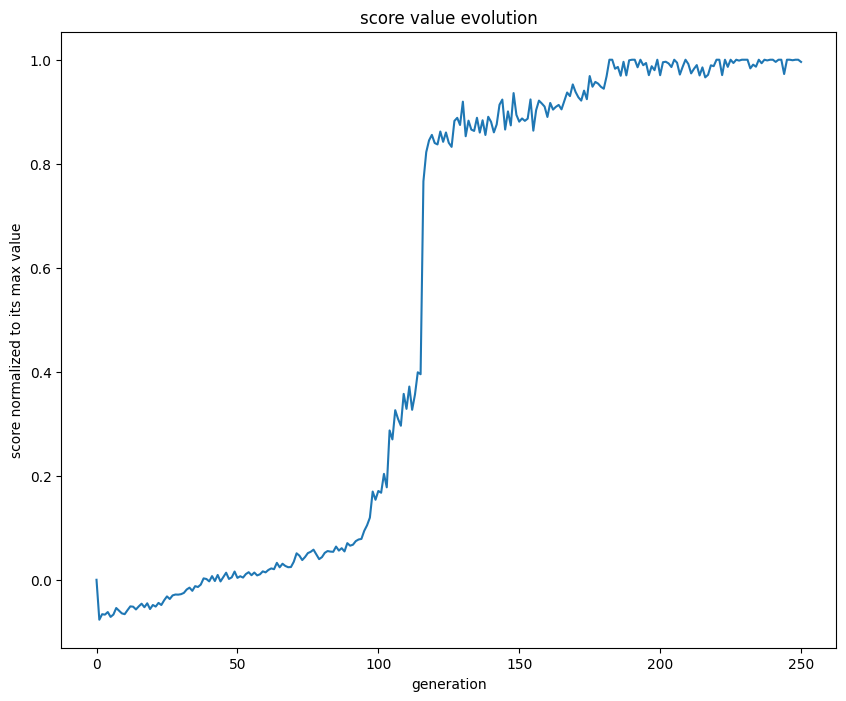

In [6]:
# plot score function over generations
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

max_score/=max_score.max()
ax.set_title("score value evolution")
ax.set_xlabel("generation")
ax.set_ylabel("score normalized to its max value")
ax.plot(range(generations + 1), max_score)

In [ ]:
# nice genome found
best_genome = np.array([0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1,
       0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0,
       0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1,
       1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1,
       0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0,
       0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 0, 0, 0, 0])

In [7]:
ca = CellularAutomaton(0, population[0].genome, np.random.randint(2, size=(150, 150)))

In [8]:
# evolution of selected genome
for step in range(300):
    ca.evolve()

In [12]:
# create animation of automaton with selected genome
fig, ax = plt.subplots(1, 1, figsize=(10,8))

def animate(i):

    ax.clear()
    ax.set_title(f"step: {i}")

    ax.imshow(ca.history[i])

anim = FuncAnimation(fig, func=animate, interval=100, frames=300)
plt.close()

anim.save("./cellular_automaton.gif", writer=PillowWriter(fps=60))
anim

/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(
